In [1]:
%%capture
!pip install ultralytics

In [2]:
import warnings
warnings.filterwarnings('ignore')
import glob
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import cv2
import yaml
import torch
from PIL import Image
from IPython.display import display, Video
from ultralytics import YOLO
from collections import deque
import subprocess  # For executing ffmpeg

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
# Define dataset paths
train_dir = "/kaggle/input/datasets/ronakgohil/license-plate-dataset/archive/images/train"
val_dir = "/kaggle/input/datasets/ronakgohil/license-plate-dataset/archive/images/val"

# Define class names
classes = ["license_plate"]  # Add more classes if needed

# Create YAML content
data_yaml_content = f"""
train: {train_dir}
val: {val_dir}

nc: {len(classes)}  # Number of classes
names: {classes}  # Class names
"""

# Save to a file
yaml_path = "/kaggle/working/data.yaml"
with open(yaml_path, "w") as f:
    f.write(data_yaml_content)

# Display the content for verification
!cat {yaml_path}



train: /kaggle/input/datasets/ronakgohil/license-plate-dataset/archive/images/train
val: /kaggle/input/datasets/ronakgohil/license-plate-dataset/archive/images/val

nc: 1  # Number of classes
names: ['license_plate']  # Class names


In [4]:
model = YOLO("yolov8n.pt")

In [5]:
results = model.train(
    data="/kaggle/working/data.yaml",
    epochs=50,  
    imgsz=640, 
    lr0= 0.0005,  
    batch=32,
    lrf=0.1,
    augment=True
)

Ultralytics 8.4.69 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, per

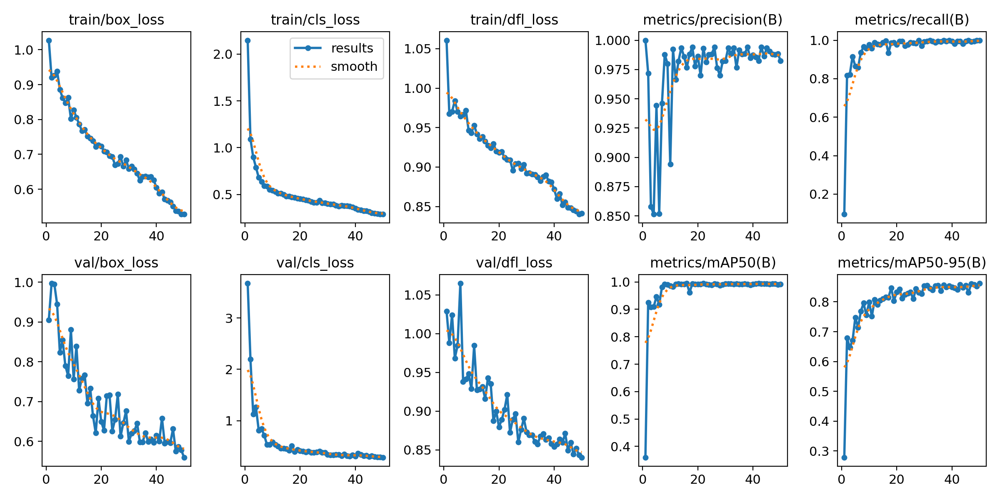

In [6]:
train_results = "/kaggle/working/runs/detect/train/results.png"

if os.path.exists(train_results):
    img = Image.open(train_results)  # Use PIL to read the image
    display(img)  # Display the image
else:
    print("Training results image not found.")



In [7]:
import pandas as pd

results_path = 'runs/detect/train/results.csv' 
df = pd.read_csv(results_path)
df.columns = df.columns.str.strip()

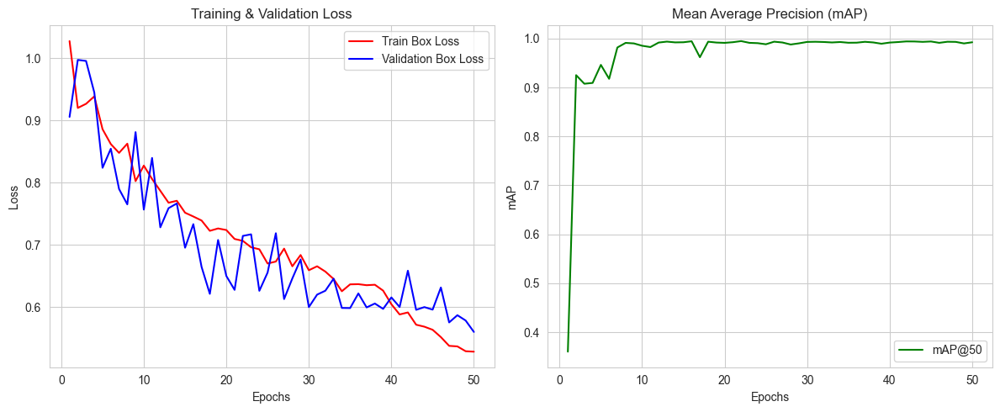

In [8]:
map_column = "metrics/mAP50(B)" 
loss_column_train = "train/box_loss"
loss_column_val = "val/box_loss"

plt.figure(figsize=(12, 5))
sns.set_style("whitegrid")

# 📌 Plot Train Loss and Validation Loss
plt.subplot(1, 2, 1)
plt.plot(df["epoch"], df[loss_column_train], label="Train Box Loss", color="red")
plt.plot(df["epoch"], df[loss_column_val], label="Validation Box Loss", color="blue")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training & Validation Loss")
plt.legend()

# 📌 Plot mAP@50
plt.subplot(1, 2, 2)
plt.plot(df["epoch"], df[map_column], label="mAP@50", color="green")
plt.xlabel("Epochs")
plt.ylabel("mAP")
plt.title("Mean Average Precision (mAP)")
plt.legend()

plt.tight_layout()
plt.show()


In [9]:
model.export(format='onnx', name='lpr_detection.onnx', opset=12)

Ultralytics 8.4.69 🚀 Python-3.12.13 torch-2.10.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
Model summary (fused): 73 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs

PyTorch: starting from '/kaggle/working/runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (6.0 MB)
requirements: Ultralytics requirements ['onnxruntime', 'onnxslim>=0.1.82'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 12 packages in 211ms
 Downloaded onnxruntime
Prepared 2 packages in 272ms
Installed 2 packages in 15ms
 + onnxruntime==1.27.0
 + onnxslim==0.1.94

requirements: AutoUpdate success ✅ 0.9s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.21.0 opset 12...
ONNX: slimming with onnxslim 0.1.94...
ONNX: exp

'/kaggle/working/runs/detect/train/weights/best.onnx'


image 1/1 /kaggle/input/datasets/aslanahmedov/number-plate-detection/images/N169.jpeg: 416x640 1 license_plate, 36.7ms
Speed: 1.7ms preprocess, 36.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 /kaggle/input/datasets/aslanahmedov/number-plate-detection/images/N18.jpeg: 448x640 1 license_plate, 36.8ms
Speed: 2.0ms preprocess, 36.8ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /kaggle/input/datasets/aslanahmedov/number-plate-detection/images/N99.jpeg: 480x640 1 license_plate, 36.0ms
Speed: 1.7ms preprocess, 36.0ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/input/datasets/aslanahmedov/number-plate-detection/images/N116.jpeg: 384x640 1 license_plate, 37.6ms
Speed: 1.5ms preprocess, 37.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/input/datasets/aslanahmedov/number-plate-detection/images/N132.jpeg: 576x640 2 license_plates, 36.6ms
Speed: 2.0ms 

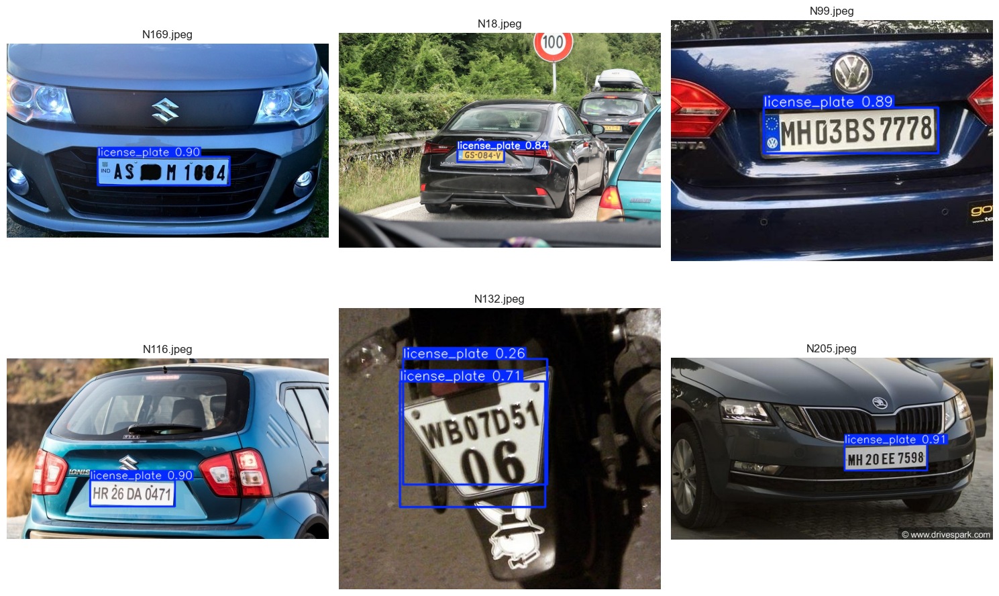

In [10]:
# Collect all images from the directory
all_images = glob.glob("/kaggle/input/datasets/aslanahmedov/number-plate-detection/images/*.jpeg")

# Randomly select 6 different images each time
test_images = random.sample(all_images, 6)

# Create a figure with 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for img_path, ax in zip(test_images, axes.flatten()):
    results = model(img_path)      # Run YOLO on the image
    result_img = results[0].plot() # Get the annotated image
    
    # Convert the annotated image to RGB for plotting
    img_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
    ax.imshow(img_rgb)
    ax.axis("off")
    ax.set_title(os.path.basename(img_path))  # Show the image filename

plt.tight_layout()
plt.show()

In [11]:
# Load the trained YOLOv8 model
model_path = "/kaggle/working/runs/detect/train/weights/best.pt"
model = YOLO(model_path)

# Define input and output video paths
input_video = "/kaggle/input/datasets/nimishshandilya/car-number-plate-video/Automatic Number Plate Recognition (ANPR) _ Vehicle Number Plate Recognition (1).mp4"
output_video = "/kaggle/working/output_video.mp4"
compressed_video = "/kaggle/working/output_video_compressed.mp4"  # Compressed version

# Open the input video file
cap = cv2.VideoCapture(input_video)

# Get video properties
fps = int(cap.get(cv2.CAP_PROP_FPS))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(output_video, fourcc, fps, (width, height))

# Process video frame by frame
frame_count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Run YOLOv8 on the frame
    results = model(frame, verbose=False)  # No extra logs

    # Draw bounding boxes
    for result in results:
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            conf = box.conf[0].item()
            label = f"Plate {conf:.2f}"

            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(frame, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Write frame to output video
    out.write(frame)
    frame_count += 1

# Release video resources
cap.release()
out.release()
cv2.destroyAllWindows()
print(f"✅ Detection completed! Processed {frame_count} frames.")

# ✅ **Compress the video using FFmpeg**
print("⏳ Compressing video... (This may take a few seconds)")
ffmpeg_command = [
    "ffmpeg", "-i", output_video, "-vcodec", "libx264", "-crf", "28", "-preset", "fast", compressed_video
]
subprocess.run(ffmpeg_command, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
print("✅ Compression done!")

# Function to display video in Jupyter Notebook (Kaggle Compatible)
from IPython.display import HTML
from base64 import b64encode

def play_video(file_path, width=800):
    """Display a video file directly in a Jupyter Notebook (Kaggle compatible)."""
    try:
        with open(file_path, "rb") as video_file:
            video_data = video_file.read()
            video_base64 = b64encode(video_data).decode()
    except FileNotFoundError:
        return HTML("<p style='color:red;'>🚨 Error: Video file not found!</p>")
    
    video_html = f"""
    <video width="{width}" controls autoplay loop>
        <source src="data:video/mp4;base64,{video_base64}" type="video/mp4">
        Your browser does not support the video tag.
    </video>
    """
    
    return HTML(video_html)

# Display the compressed video
play_video(compressed_video, width=1000)


✅ Detection completed! Processed 930 frames.
⏳ Compressing video... (This may take a few seconds)
✅ Compression done!


-----------------